## ENTREAMIENTO DE MODELO PARA ACCIDENTES DE TRAFICO

LIBRERIAS A UTILIZAR

Instalacion de las librerias para el proyecto, ultralytics contiene el modelo YOLO y roboflow es la plataforma del banco de datasets para el entrenamiento del modelo.


In [ ]:
!pip install ultralytics roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 65.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.9/86.9 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 88.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 83.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3

In [ ]:
!nvidia-smi

Sat Jul 12 15:04:47 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# Acceso al Drive.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## DATASETS

Para el proyecto se utilizo el primer dataset.


In [ ]:
# Extraer el conjunto  de imagenes para el test, train y valid.
from roboflow import Roboflow
rf = Roboflow(api_key="IbYP69GYtSVW2T6pEpx0")
project = rf.workspace("detecciondecolisiones").project("traffic-accident-detection-rwtmw")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Traffic-Accident-Detection-1 in yolov11:: 100%|██████████| 2036/2036 [00:00<00:00, 5392.61it/s]


In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="IbYP69GYtSVW2T6pEpx0")
project = rf.workspace("ann-qwhjm").project("accident-detection-cwbvs")
version = project.version(2)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to accident-detection-2 in yolov11:: 100%|██████████| 17624/17624 [00:03<00:00, 5342.43it/s]


<h2>PROCESAMIENTO DE IMAGENES</h2>

Libreria openCV para el procesamiento de imagenes por vision de computadora.


In [ ]:
!pip install opencv-python

ENTRENAMIENTO DE MODELO


In [ ]:
# Se llamada al modelo YOLO
from ultralytics import YOLO
import os # Libreria para el acceso a nivel de sistema operativo del entorno.

# Modelos preentrenados.
model = YOLO("yolov8m.pt")
model1 = YOLO("yolo11m.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 49.7M/49.7M [00:01<00:00, 51.1MB/s]


100%|██████████| 38.8M/38.8M [00:00<00:00, 185MB/s]


In [ ]:
# Entrenamiento del modelo con 100 epocas y las imagenes de 640x640

model1.train(
    data="/content/Traffic-Accident-Detection-1/data.yaml",  # ruta al archivo YAML de Roboflow
    epochs=100,                          # puedes ajustar
    imgsz=640,                          # tamaño de las imágenes
    batch=8,                            # según tu RAM/GPU
    project="AccidentDetection",
    name="YOLOv11m-accidentes",
    exist_ok=True
)

Ultralytics 8.3.165 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Traffic-Accident-Detection-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=YOLOv11m-accidentes, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, p

100%|██████████| 755k/755k [00:00<00:00, 20.5MB/s]

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

 11                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 13                  -1  1   1642496  ultralytics.nn.modules.block.C3k2            [1024, 512, 1, True]          
 14                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 15             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 16                  -1  1    542720  ultralytics.nn.modules.block.C3k2            [1024, 256, 1, True]          
 17                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
 18            [-1, 13]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 19                  -1  1   1511424  ultralytics.nn.modules.block.C3k2            [768,

100%|██████████| 5.35M/5.35M [00:00<00:00, 103MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1979.7±753.3 MB/s, size: 136.3 KB)


train: Scanning /content/Traffic-Accident-Detection-1/train/labels... 662 images, 0 backgrounds, 0 corrupt: 100%|██████████| 662/662 [00:00<00:00, 2047.22it/s]

train: New cache created: /content/Traffic-Accident-Detection-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 967.5±649.0 MB/s, size: 73.7 KB)


val: Scanning /content/Traffic-Accident-Detection-1/valid/labels... 295 images, 0 backgrounds, 0 corrupt: 100%|██████████| 295/295 [00:00<00:00, 753.97it/s]

val: New cache created: /content/Traffic-Accident-Detection-1/valid/labels.cache


Plotting labels to AccidentDetection/YOLOv11m-accidentes/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to AccidentDetection/YOLOv11m-accidentes
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.13G      1.528      2.198      1.465         17        640: 100%|██████████| 83/83 [00:27<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.24it/s]


                   all        295       1007      0.104        0.2     0.0645     0.0263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.98G      1.885      2.356       1.77         32        640: 100%|██████████| 83/83 [00:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


                   all        295       1007     0.0449      0.373     0.0231    0.00885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.05G      2.055      2.449      1.884         38        640: 100%|██████████| 83/83 [00:24<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.56it/s]

                   all        295       1007     0.0648      0.308     0.0408     0.0132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.12G      2.004      2.511      1.871        121        640: 100%|██████████| 83/83 [00:25<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]

                   all        295       1007      0.184      0.242      0.114     0.0415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.18G      2.009      2.429      1.884         30        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.32it/s]

                   all        295       1007       0.18      0.197      0.111     0.0396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.52G      2.038      2.418      1.864         19        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


                   all        295       1007      0.147      0.249      0.116     0.0431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.59G       1.93      2.332      1.803         21        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]

                   all        295       1007      0.294      0.308      0.216     0.0914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.65G      1.905      2.269      1.778         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]


                   all        295       1007      0.298        0.3      0.234      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.72G      1.857      2.237      1.722         22        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.32it/s]

                   all        295       1007      0.338      0.239      0.205     0.0893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.79G      1.796      2.146      1.708         21        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


                   all        295       1007      0.425      0.384      0.323      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.85G      1.768      2.122      1.692         24        640: 100%|██████████| 83/83 [00:25<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]

                   all        295       1007      0.295      0.364      0.287      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.92G       1.78      2.064       1.69         11        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.40it/s]

                   all        295       1007       0.48      0.345      0.338      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.98G      1.717      2.004      1.657         24        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.36it/s]

                   all        295       1007      0.352      0.413      0.317      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.05G      1.696      1.981      1.639         18        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.21it/s]


                   all        295       1007      0.434      0.433      0.378      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.12G      1.693      1.943      1.636         38        640: 100%|██████████| 83/83 [00:25<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]

                   all        295       1007      0.492      0.444        0.4      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.18G      1.638      1.896      1.585         14        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.43it/s]

                   all        295       1007       0.42      0.401      0.317      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.25G      1.643      1.854      1.578         33        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.32it/s]

                   all        295       1007      0.503      0.423      0.416      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.31G      1.601       1.81       1.55         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.31it/s]


                   all        295       1007      0.558      0.475      0.491       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.38G      1.635      1.791      1.555         31        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]

                   all        295       1007      0.491      0.465      0.438      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.45G      1.561      1.756      1.532         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]

                   all        295       1007      0.563      0.459      0.478      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.51G      1.607      1.743      1.561         55        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.41it/s]

                   all        295       1007      0.564      0.494      0.494       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.58G      1.551       1.69      1.519         17        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.39it/s]

                   all        295       1007      0.605      0.468      0.505      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.65G      1.534      1.656      1.499         29        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]

                   all        295       1007      0.609      0.508      0.536      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.71G      1.556       1.66      1.528         14        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.22it/s]

                   all        295       1007      0.578      0.484      0.505       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.11G      1.506      1.659        1.5         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007       0.63      0.458      0.518      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.17G      1.517       1.62      1.508         77        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.33it/s]

                   all        295       1007      0.636      0.494      0.528      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.24G      1.494      1.592      1.479         33        640: 100%|██████████| 83/83 [00:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]

                   all        295       1007      0.546      0.544      0.527      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       7.3G      1.511      1.604      1.484         34        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.43it/s]

                   all        295       1007      0.561      0.475      0.475      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.37G      1.487      1.553      1.473         22        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.41it/s]

                   all        295       1007      0.619      0.508       0.53      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.81G      1.463       1.59      1.477         46        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]

                   all        295       1007      0.623      0.515      0.543      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.35G      1.455       1.46      1.435         51        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]

                   all        295       1007      0.653      0.496      0.555       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.35G      1.413      1.429      1.417         44        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.40it/s]

                   all        295       1007      0.572      0.511      0.523      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.35G      1.401      1.459      1.424         46        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.633      0.537      0.557       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.35G      1.442      1.486      1.448         36        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.28it/s]

                   all        295       1007      0.581      0.559       0.56      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.35G      1.424      1.432      1.422         22        640: 100%|██████████| 83/83 [00:25<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]

                   all        295       1007      0.653      0.522      0.568      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.35G      1.397      1.438       1.43         25        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.39it/s]

                   all        295       1007        0.6      0.546      0.578      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.38G      1.385      1.416      1.402         38        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007      0.574      0.557      0.558       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.44G      1.387      1.426      1.416         23        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.29it/s]

                   all        295       1007      0.652      0.577      0.607      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.51G      1.363      1.355      1.389         59        640: 100%|██████████| 83/83 [00:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]

                   all        295       1007      0.677      0.538      0.586      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.58G      1.357      1.356      1.408         25        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.39it/s]

                   all        295       1007      0.615      0.541      0.539      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.64G      1.333      1.328      1.383         25        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.41it/s]

                   all        295       1007       0.65      0.551      0.586      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.71G      1.363       1.36      1.396         25        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.36it/s]

                   all        295       1007      0.646       0.53      0.585      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.77G      1.363      1.362      1.394         24        640: 100%|██████████| 83/83 [00:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]

                   all        295       1007      0.671      0.533      0.599      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.17G      1.328      1.343      1.369         36        640: 100%|██████████| 83/83 [00:25<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]

                   all        295       1007      0.643      0.586      0.624      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.23G      1.302      1.287      1.363         38        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.43it/s]

                   all        295       1007       0.65      0.572      0.611      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       6.3G      1.296      1.275       1.36         21        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.43it/s]

                   all        295       1007      0.656      0.562      0.608      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.36G      1.307      1.315      1.365         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.13it/s]

                   all        295       1007      0.645      0.602      0.619      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.43G      1.274      1.225      1.335         44        640: 100%|██████████| 83/83 [00:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]

                   all        295       1007      0.673      0.585      0.632      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100       6.5G      1.248      1.222      1.328         17        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.707       0.56       0.63      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.56G      1.277      1.183      1.329         41        640: 100%|██████████| 83/83 [00:25<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.45it/s]

                   all        295       1007      0.658      0.604      0.633      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.63G      1.247      1.193       1.31         23        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.20it/s]

                   all        295       1007      0.603      0.572      0.599      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       6.7G      1.262      1.202      1.322         44        640: 100%|██████████| 83/83 [00:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]

                   all        295       1007      0.729      0.566      0.648       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.76G      1.238      1.166      1.316         32        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007      0.626      0.601      0.618      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.83G      1.245      1.205      1.331         25        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.45it/s]

                   all        295       1007      0.626      0.605      0.613      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.98G      1.224      1.133      1.296         23        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.30it/s]

                   all        295       1007      0.693      0.587      0.644      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.04G      1.263      1.179      1.343         47        640: 100%|██████████| 83/83 [00:25<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]

                   all        295       1007      0.672      0.598      0.636      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.17G      1.185       1.09      1.271         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.36it/s]

                   all        295       1007      0.702      0.577      0.629      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.32G      1.199      1.107      1.288         26        640: 100%|██████████| 83/83 [00:26<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007      0.668       0.59      0.637      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.43G      1.138      1.068      1.265         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.29it/s]

                   all        295       1007      0.689      0.592      0.642      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.78G      1.151       1.03      1.274         24        640: 100%|██████████| 83/83 [00:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]

                   all        295       1007      0.641      0.597      0.633      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.78G      1.171      1.077      1.279         45        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.41it/s]

                   all        295       1007      0.682       0.59      0.633      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.78G      1.186      1.088      1.276         48        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007      0.719      0.595       0.65      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.78G      1.175      1.052      1.273         46        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.36it/s]

                   all        295       1007      0.688      0.574      0.639      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.78G      1.151      1.049       1.26         20        640: 100%|██████████| 83/83 [00:25<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.79it/s]

                   all        295       1007      0.707      0.591      0.654      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.11G      1.146      1.034      1.254         54        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.732      0.569      0.642      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.13G      1.118      1.005      1.223         21        640: 100%|██████████| 83/83 [00:26<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.674      0.608      0.649      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100       5.2G      1.128      1.034      1.251         28        640: 100%|██████████| 83/83 [00:25<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.19it/s]

                   all        295       1007       0.65      0.608      0.634      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.27G      1.122     0.9794      1.237         22        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]

                   all        295       1007      0.697      0.609      0.655      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.33G      1.115      0.963       1.22         37        640: 100%|██████████| 83/83 [00:25<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.685       0.59      0.655      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       5.4G      1.104     0.9639      1.221         48        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007      0.712      0.592      0.651      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.46G      1.096     0.9458      1.236         43        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.652      0.615      0.637       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.61G      1.088     0.9215       1.21         51        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]

                   all        295       1007      0.708      0.591      0.655      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.67G      1.066     0.9337      1.216         26        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.46it/s]

                   all        295       1007      0.732      0.578       0.64      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.84G      1.058      0.925      1.211         16        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.696      0.601      0.657      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.95G      1.066       0.92      1.196         46        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.33it/s]


                   all        295       1007      0.742      0.608      0.667      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.05G      1.055     0.8764       1.18         30        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]

                   all        295       1007      0.674      0.634      0.655      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.19G      1.045     0.8995       1.19         35        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]

                   all        295       1007      0.714       0.58      0.648      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.26G      1.054     0.8808      1.172         19        640: 100%|██████████| 83/83 [00:25<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.40it/s]

                   all        295       1007      0.727      0.619       0.67      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.39G      1.024     0.8538      1.171         67        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.41it/s]

                   all        295       1007      0.709      0.585      0.651      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.46G      1.016     0.8648      1.176         24        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]

                   all        295       1007      0.755      0.602      0.672      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.61G      1.021     0.8496      1.181         38        640: 100%|██████████| 83/83 [00:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.14it/s]

                   all        295       1007      0.735      0.599      0.666      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.75G      1.033     0.8407      1.176         43        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007      0.738      0.598      0.676      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.81G     0.9622     0.7936      1.142         37        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.46it/s]

                   all        295       1007       0.74      0.597      0.676      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.93G     0.9977     0.8179      1.169         45        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]


                   all        295       1007      0.674      0.618      0.651      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      7.08G     0.9711     0.7989      1.151         39        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]

                   all        295       1007      0.728      0.623      0.676      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100       7.2G     0.9838     0.7963      1.156         46        640: 100%|██████████| 83/83 [00:25<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007      0.747      0.631      0.678       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.27G     0.9591      0.792      1.163         24        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.745      0.605      0.678      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.45G     0.9831     0.8011      1.152         32        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]

                   all        295       1007      0.743       0.62      0.676      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.74G     0.9546     0.7747       1.14         28        640: 100%|██████████| 83/83 [00:25<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]

                   all        295       1007      0.763      0.617      0.689      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.74G     0.9433     0.7595      1.136         18        640: 100%|██████████| 83/83 [00:25<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.768      0.607      0.691      0.464


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.74G     0.9383      0.735      1.132         10        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.721       0.61      0.667      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.74G     0.9341     0.7124      1.123         30        640: 100%|██████████| 83/83 [00:25<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.19it/s]

                   all        295       1007      0.723      0.598      0.668      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.74G     0.8964      0.679      1.107          9        640: 100%|██████████| 83/83 [00:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]

                   all        295       1007      0.731      0.605      0.671      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.06G     0.8974     0.6697      1.098         16        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.731      0.625      0.673      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.13G     0.8788     0.6362      1.092         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.745      0.628      0.681      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       5.2G      0.883      0.644      1.095         10        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.42it/s]

                   all        295       1007      0.745      0.619      0.677      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.26G     0.8907     0.6327      1.101         27        640: 100%|██████████| 83/83 [00:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]

                   all        295       1007      0.761      0.619      0.681      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.33G       0.85     0.6086       1.06         13        640: 100%|██████████| 83/83 [00:25<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]

                   all        295       1007      0.703      0.655      0.688      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       5.4G     0.8527     0.6125      1.068         26        640: 100%|██████████| 83/83 [00:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.43it/s]

                   all        295       1007      0.708      0.663      0.684      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.46G     0.8496     0.6067       1.07         26        640: 100%|██████████| 83/83 [00:25<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]

                   all        295       1007       0.71      0.651      0.684      0.461



100 epochs completed in 0.862 hours.
Optimizer stripped from AccidentDetection/YOLOv11m-accidentes/weights/last.pt, 40.5MB
Optimizer stripped from AccidentDetection/YOLOv11m-accidentes/weights/best.pt, 40.5MB

Validating AccidentDetection/YOLOv11m-accidentes/weights/best.pt...
Ultralytics 8.3.165 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,031,574 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        295       1007      0.763      0.617      0.689      0.465
              accident        201        214       0.78      0.794      0.845      0.631
               vehicle        212        793      0.746       0.44      0.533      0.298
Speed: 0.3ms preprocess, 10.6ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to AccidentDetection/YOLOv11m-accidentes


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e4e0c36b6d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
HOME = os.getcwd()

In [ ]:
# Recoleccion de datos importantes.
!ls {HOME}/AccidentDetection/YOLOv11m-accidentes

args.yaml			 labels.jpg	      train_batch7472.jpg
BoxF1_curve.png			 results.csv	      val_batch0_labels.jpg
BoxP_curve.png			 results.png	      val_batch0_pred.jpg
BoxPR_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
BoxR_curve.png			 train_batch1.jpg     val_batch1_pred.jpg
confusion_matrix_normalized.png  train_batch2.jpg     val_batch2_labels.jpg
confusion_matrix.png		 train_batch7470.jpg  val_batch2_pred.jpg
labels_correlogram.jpg		 train_batch7471.jpg  weights


## RESULTADOS
GRAFICA DE LA MATRIZ DE CONFUSIÓN

/content


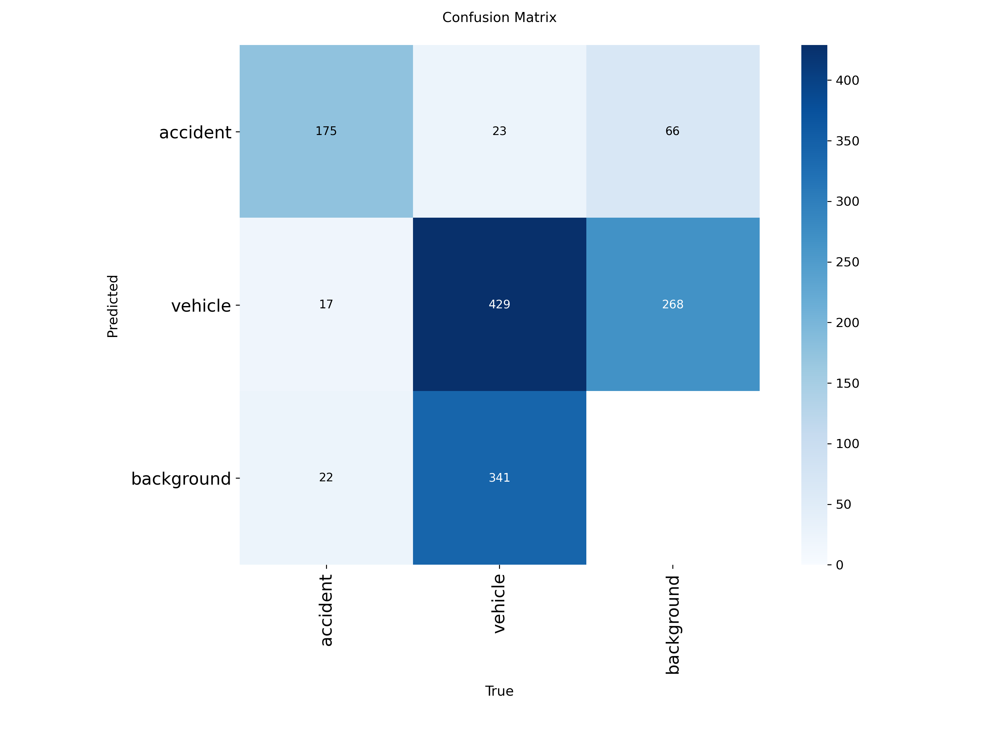

In [ ]:
# Libreria para convertir a imagen los resultados despues del entranmiento del modelo.
from IPython.display import display, Image

%cd {HOME}
Image(filename=f'{HOME}/AccidentDetection/YOLOv11m-accidentes/confusion_matrix.png', width=600)

IMAGENES DE VALIDACION

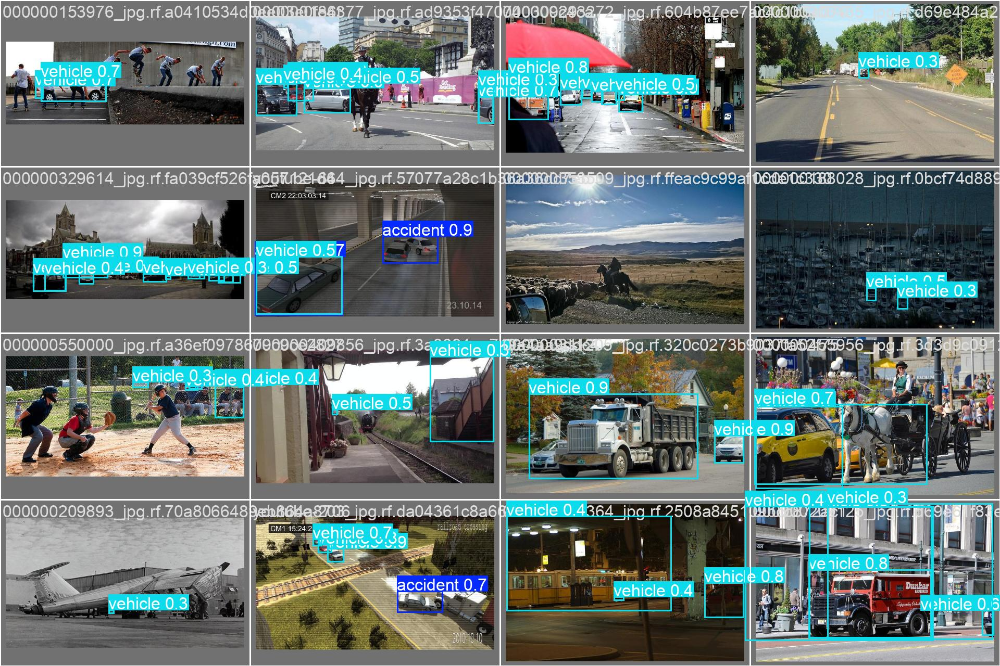

In [ ]:
Image(filename=f'{HOME}/AccidentDetection/YOLOv11m-accidentes/val_batch0_pred.jpg', width=600)

VALIDACION DEL MODELO

In [ ]:
# cargamos el modelo entrando.
from ultralytics import YOLO
modelo_entrenado = YOLO(f"{HOME}/drive/MyDrive/DETECCION_DE_COLISIONES/MODELOS/best.pt")

# Con el metodo val, hacemos una validacion del modelo con el dataset.
model.val(data=f"{HOME}/Traffic-Accident-Detection-1/data.yaml")

Ultralytics 8.3.167 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,886,080 parameters, 0 gradients, 78.9 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 106MB/s]

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1704.7±618.5 MB/s, size: 56.7 KB)



val: Scanning /content/Traffic-Accident-Detection-1/valid/labels... 295 images, 0 backgrounds, 0 corrupt: 100%|██████████| 295/295 [00:00<00:00, 1573.96it/s]


val: New cache created: /content/Traffic-Accident-Detection-1/valid/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  2.02it/s]


                   all        295       1007     0.0262      0.235     0.0178     0.0101
                person        201        214    0.00931       0.43     0.0108    0.00603
               bicycle        212        793      0.043     0.0404     0.0247     0.0141
Speed: 1.1ms preprocess, 19.0ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7983784db390>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

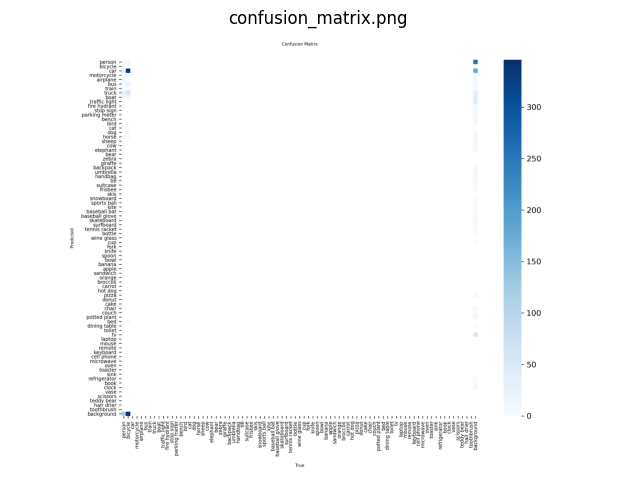

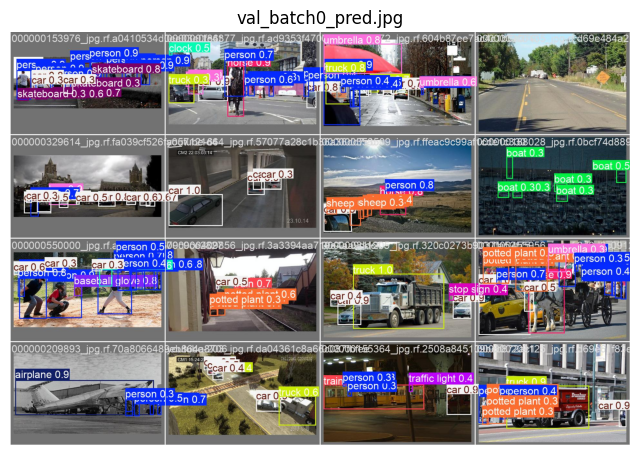

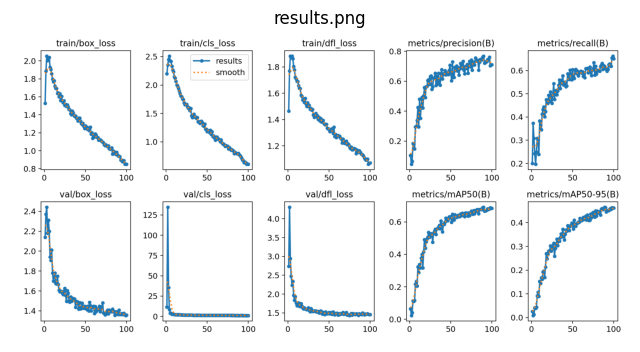

In [ ]:
path = f"{HOME}/runs/detect/val"

import cv2
import matplotlib.pyplot as plt

# Cargar imagen desde disco
def mostrar_imagen(path):
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(path.split('/')[-1])
    plt.show()

# Mostrar gráficas importantes
mostrar_imagen(f"{path}/confusion_matrix.png")
mostrar_imagen(f"{path}/val_batch0_pred.jpg")
mostrar_imagen("/content/AccidentDetection/YOLOv11m-accidentes/results.png")

PREDICCIÓN DEL MODELO

In [ ]:
# En este apartado se hace el test del modelo.

source_path = "/content/Traffic-Accident-Detection-1/test/images"
results = modelo_entrenado.predict(
    source=source_path,
    conf=0.25,       # Umbral de confianza mínimo
    save=True        # Guardar resultados con anotaciones
)


image 1/55 /content/Traffic-Accident-Detection-1/test/images/Screenshot-2023-11-14-175910_png_jpg.rf.10b315445e2d0497fbb1a81b192a839e.jpg: 448x640 1 accident, 48.8ms
image 2/55 /content/Traffic-Accident-Detection-1/test/images/Screenshot-2023-11-14-180016_png_jpg.rf.854287615450231b2a1237c4ea5cae21.jpg: 384x640 1 accident, 56.3ms
image 3/55 /content/Traffic-Accident-Detection-1/test/images/Screenshot-2023-11-14-180108_png_jpg.rf.59fd16cd04b48ef3801f55158f38461e.jpg: 416x640 2 accidents, 53.7ms
image 4/55 /content/Traffic-Accident-Detection-1/test/images/Screenshot-2023-11-14-180215_png_jpg.rf.8bc8b839f5bc6fe5ad345e63a58fc72d.jpg: 512x640 1 accident, 1 vehicle, 47.9ms
image 5/55 /content/Traffic-Accident-Detection-1/test/images/Screenshot-2023-11-14-180251_png_jpg.rf.ba926c4320dda182d53dc7c7440f3b55.jpg: 416x640 2 accidents, 28.6ms
image 6/55 /content/Traffic-Accident-Detection-1/test/images/Screenshot-2023-11-14-180319_png_jpg.rf.c641b570d67ba7e239f7e3fd6376e453.jpg: 544x640 1 acciden

ALGUNAS IMAGENES

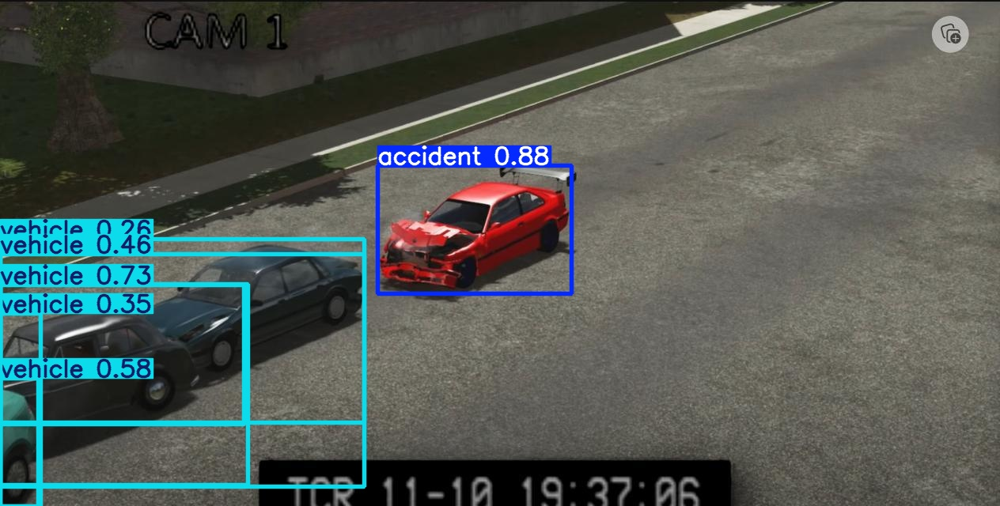

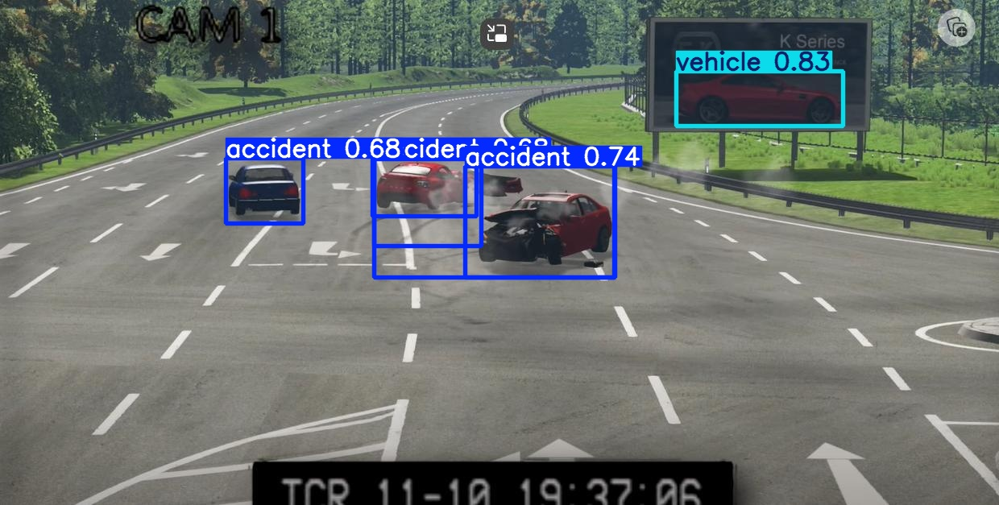

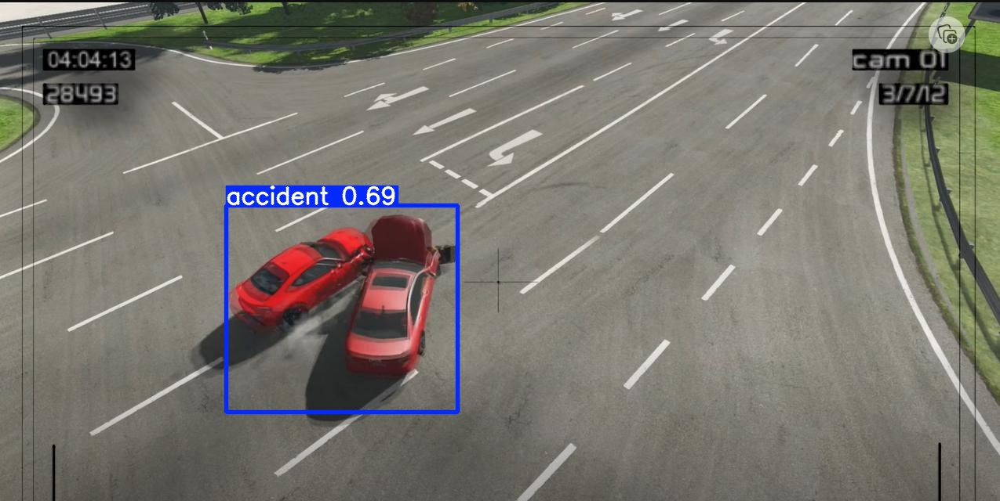

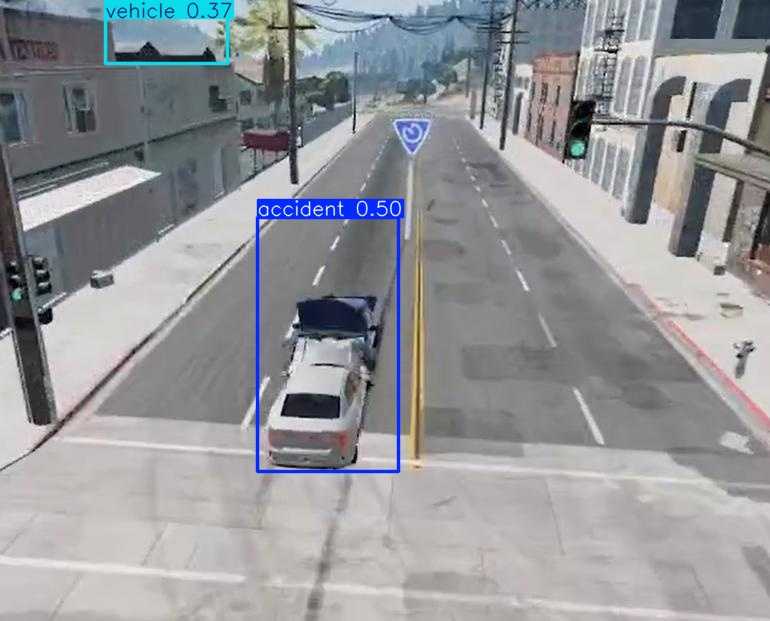

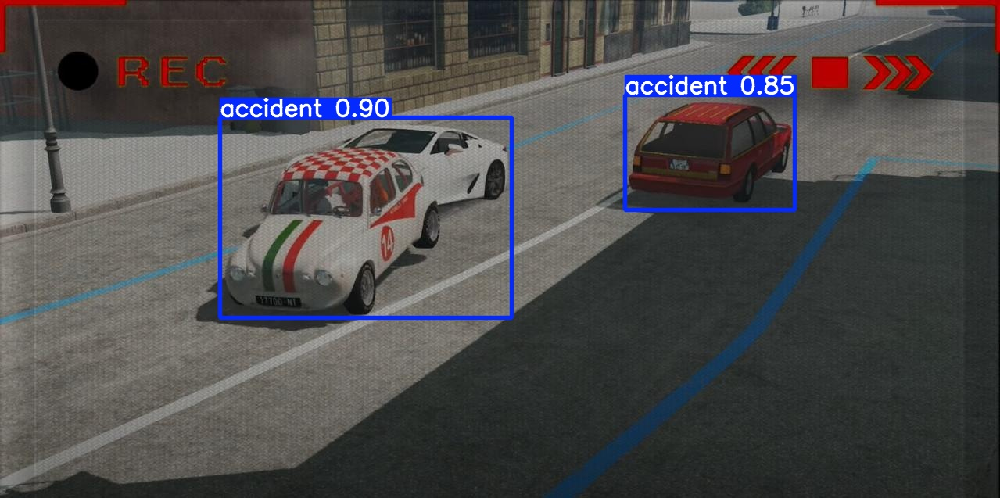

...

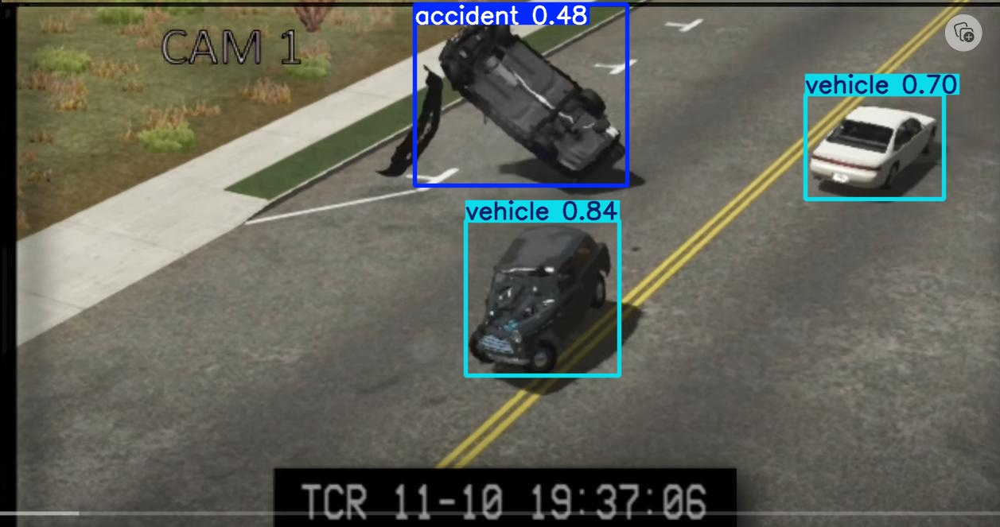

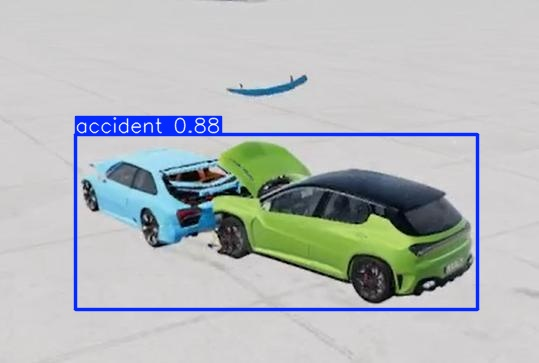

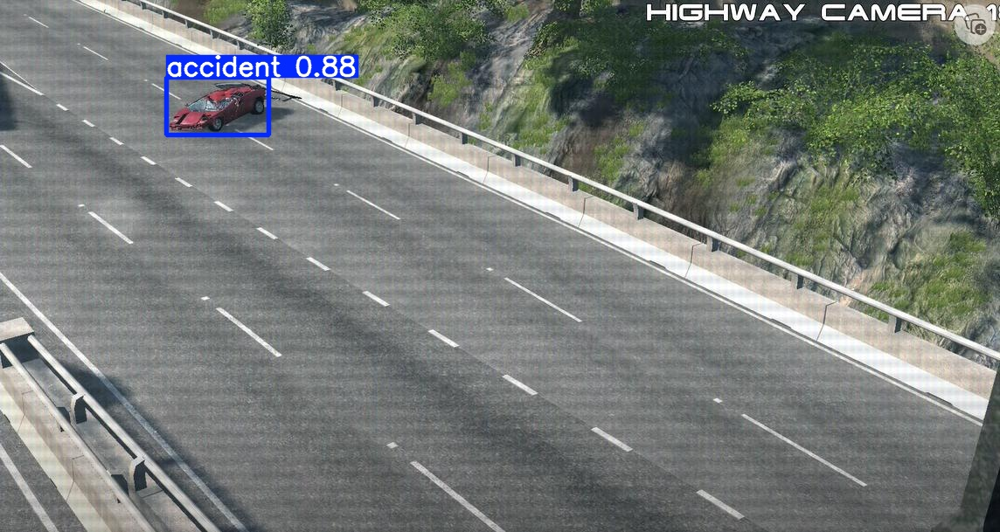

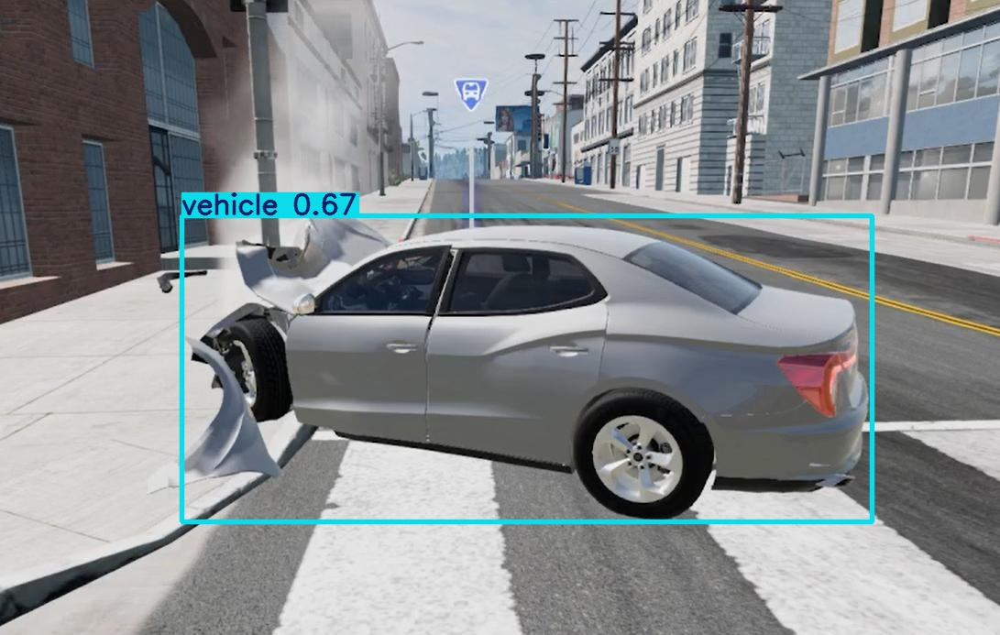

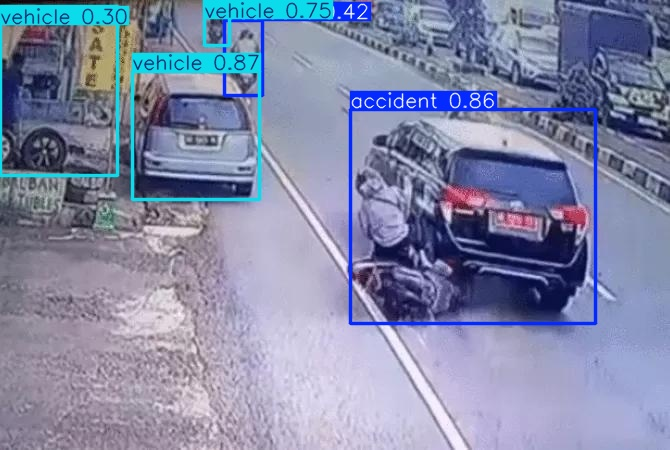

In [ ]:
# Ruta a la carpeta de predicciones
predict_folder = f"{HOME}/runs/detect/predict"

# Filtrar solo archivos de imagen (.jpg, .png)
img_files = [f for f in os.listdir(predict_folder) if f.endswith((".jpg", ".png"))]

# Mostrar cada imagen con ancho de 600px
for img_name in img_files:
    img_path = os.path.join(predict_folder, img_name)
    display(Image(filename=img_path, width=600))

DESCARGAR LAS IMAGENES

In [ ]:
# Convertir el conjunto de imagenes ya predecidas a .zip para luego hacer la verificacion.
import shutil
from google.colab import files

shutil.make_archive("predicciones_yolo", 'zip', predict_folder)
files.download("predicciones_yolo.zip")
shutil.make_archive("resultados_val", 'zip', "runs/detect/val")
files.download("resultados_val.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

CODIGO PARA SISTEMA IMPLEMENTADO (NO ES FUNCIONAL)

Link: https://app.readytensor.ai/publications/car-crash-detection-using-computer-vision-ssZvU1A3DoPA


In [ ]:
import cv2
import pandas as pd
from ultralytics import YOLO
import cvzone
import smtplib
from email.mime.multipart import MIMEMultipart
from email.mime.image import MIMEImage
from email.mime.text import MIMEText
import geocoder  # To get real-time location data (optional)
from twilio.rest import Client  # To send SMS/calls

# Load YOLOv8 model (pre-trained or custom trained)
model = YOLO('best.pt')

# Emergency call function using Twilio API
def send_emergency_alert(image, location):
    # Twilio credentials (replace with actual credentials)
    account_sid = 'your_twilio_account_sid'
    auth_token = 'your_twilio_auth_token'
    client = Client(account_sid, auth_token)

    # Sending an SMS with crash details
    message = client.messages.create(
        body=f"Car crash detected! Location: {location}",
        from_='+Twilio_phone_number',
        to='+Emergency_contact_number'
    )

    # Making a call to emergency services
    call = client.calls.create(
        twiml=f"<Response><Say>Car crash detected at {location}</Say></Response>",
        to='+Emergency_contact_number',
        from_='+Twilio_phone_number'
    )

    print(f"Alert sent: {message.sid}")
    print(f"Call initiated: {call.sid}")

# Function for crash detection
def Crash_detect(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:
        point = [x, y]
        print(point)

cv2.namedWindow('Crash_detect')
cv2.setMouseCallback('Crash_detect', Crash_detect)

# Video capture
cap = cv2.VideoCapture('crash_video.mp4')

# Load class names
my_file = open("coco_classes.txt", "r")
class_list = my_file.read().split("\n")

count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
        continue

    count += 1
    if count % 3 != 0:  # Skip frames for faster processing
        continue

    frame = cv2.resize(frame, (1020, 500))

    # YOLOv8 prediction
    results = model.predict(frame)
    boxes = results[0].boxes.data

    # Convert results to DataFrame
    px = pd.DataFrame(boxes).astype("float")

    for _, row in px.iterrows():
        x1, y1, x2, y2 = map(int, row[:4])
        class_id = int(row[5])
        class_name = class_list[class_id]

        # Draw bounding boxes
        if 'accident' in class_name.lower():
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 0, 255), 3)
            cvzone.putTextRect(frame, f'{class_name}', (x1, y1), 1, 1)

            # Get location data (optional)
            g = geocoder.ip('me')  # Using IP-based location
            location = g.latlng

            # Save the frame as an image
            crash_image = "crash_event.jpg"
            cv2.imwrite(crash_image, frame)

            # Send emergency alert
            send_emergency_alert(crash_image, location)

        else:
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cvzone.putTextRect(frame, f'{class_name}', (x1, y1), 1, 1)

    cv2.imshow("Crash_Detect", frame)
    if cv2.waitKey(1) & 0xFF == 27:  # ESC key to exit
        break

cap.release()
cv2.destroyAllWindows()